**Первый этап: Распознавание лица**


In [1]:
from google.colab import drive
drive.mount('/gdrive', force_remount=True)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /gdrive


Все необходимые импорты

In [0]:
import numpy as np
from PIL import Image
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

Чтение изображения

In [3]:
img = cv2.imread('/gdrive/My Drive/images/3.jpg')
im = np.array(Image.open('/gdrive/My Drive/images/3.jpg'))
print(type(img))
print(type(im))

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>


Выделение лица

In [0]:
crop_img = []
# Load the cascade
face_cascade = cv2.CascadeClassifier('/gdrive/My Drive/opencv/data/haarcascades_cuda/haarcascade_frontalface_default.xml')
# Convert into grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# Detect faces
faces = face_cascade.detectMultiScale(gray, 1.1, 4)
# Draw rectangle around the faces
for (x, y, w, h) in faces:
    cv2.rectangle(img, (x, y), (x+w, y+h), (255, 0, 0), 1)
    crop_img.append(img[y:y+h, x:x+w])

Показ результата

(1280, 960, 3)


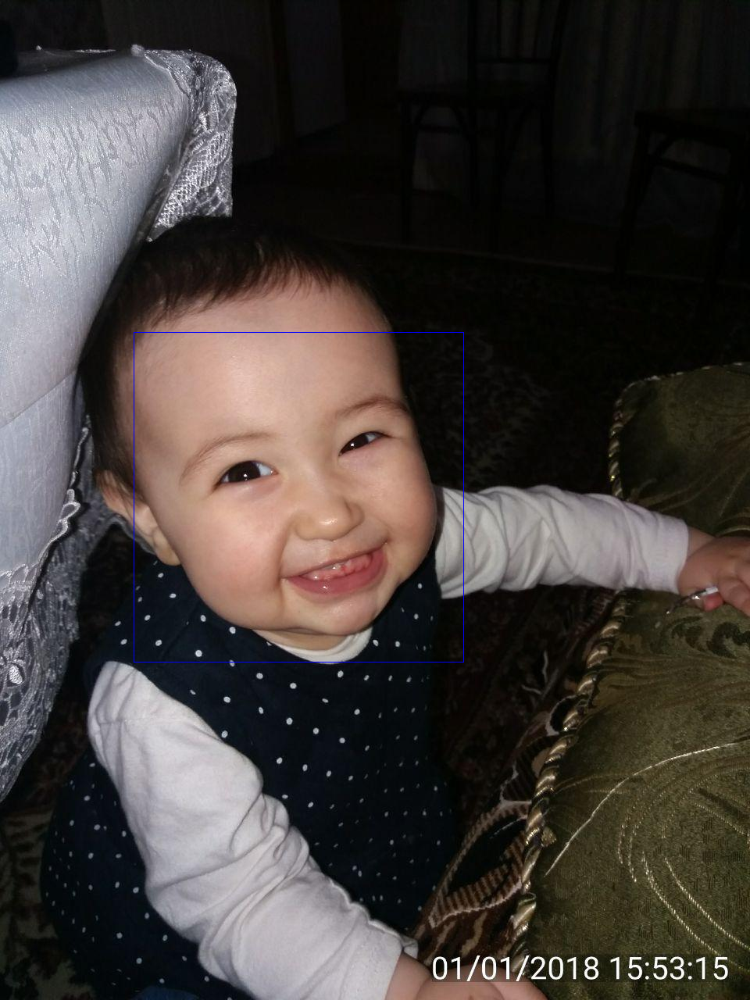

1


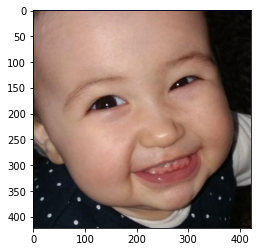

In [5]:
# Display the output
print(img.shape)
cv2_imshow(img)
print(len(crop_img))
#for i in range(len(crop_img)):
plt.imshow(cv2.cvtColor(crop_img[0], cv2.COLOR_BGR2RGB))
#plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

Приведению к стандартному размеру для модели

(200, 200, 3)


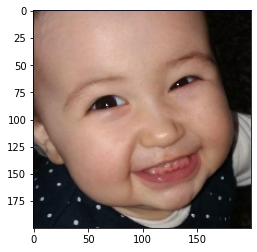

In [6]:
image = cv2.resize(crop_img[0], (200, 200))
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(image)
print(image.shape)

**Второй этап: Распознавание эмоций**

In [0]:
from tensorflow.keras.models import model_from_json
import numpy
import os

Загрузка модели

In [8]:
json_file = open('/gdrive/My Drive/DiplomWork/Forth/InceptionForEmotionDetection.json')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)
# load weights into new model
loaded_model.load_weights('/gdrive/My Drive/DiplomWork/Forth/InceptionForEmotionDetection_weights.h5')
print("Loaded model from disk")

Loaded model from disk


Скомпилируем модель

In [9]:
from tensorflow.keras import regularizers, optimizers
opt = optimizers.Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, amsgrad=False)

loaded_model.compile(optimizer=opt, 
              loss='categorical_crossentropy',
              metrics=['accuracy'])
loaded_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 200, 200, 3) 0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 99, 99, 32)   864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 99, 99, 32)   96          conv2d_1[0][0]                   
__________________________________________________________________________________________________
activation_1 (Activation)       (None, 99, 99, 32)   0           batch_normalization_1[0][0]      
____________________________________________________________________________________________

Подадим изображение модели для распознования

{'anger': 0, 'contempt': 1, 'disgust': 2, 'fear': 3, 'happiness': 4, 'neutral': 5, 'sadness': 6, 'surprise': 7}

In [10]:
image1 = image / 255
result = loaded_model.predict(image1.reshape((1, image.shape[0], image.shape[1], 3)))
print("%f -> anger" %(result[0][0]))
print("%f -> contempt" %(result[0][1]))
print("%f -> disgust" %(result[0][2]))
print("%f -> fear" %(result[0][3]))
print("%f -> happiness" %(result[0][4]))
print("%f -> neutral" %(result[0][5]))
print("%f -> sadness" %(result[0][6]))
print("%f -> surprise" %(result[0][7]))

0.000774 -> anger
0.000000 -> contempt
0.000032 -> disgust
0.000001 -> fear
0.237585 -> happiness
0.756525 -> neutral
0.000000 -> sadness
0.005084 -> surprise


**Третий этап: Анализ распознавания**

Вывод первого слоя

In [11]:
from tensorflow import keras
first_output = keras.Model(inputs=loaded_model.input, outputs=loaded_model.layers[1].output)
first_output.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 200, 200, 3)]     0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 99, 99, 32)        864       
Total params: 864
Trainable params: 0
Non-trainable params: 864
_________________________________________________________________


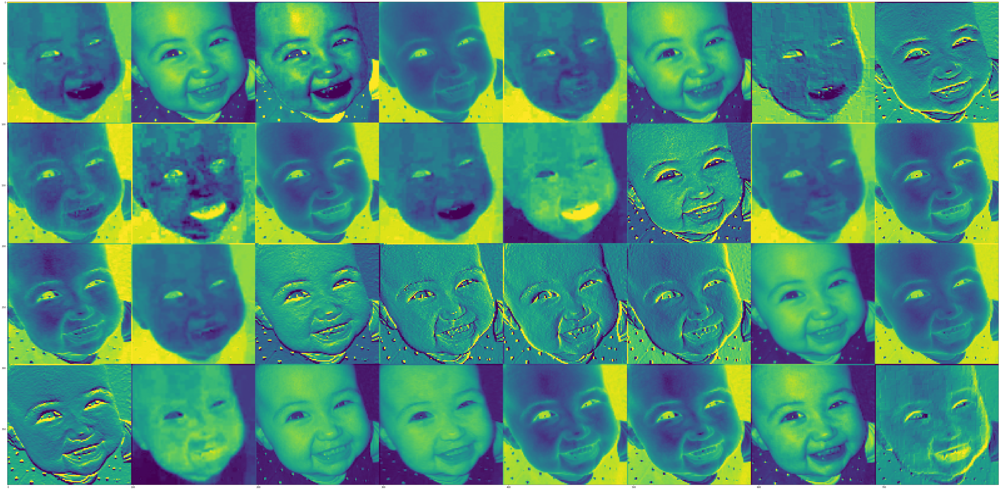

In [12]:
result1 = first_output.predict(image1.reshape((1, image.shape[0], image.shape[1], 3)))
images_per_row = 8
n_filters = result1.shape[-1]
size = result1.shape[1]
n_cols = n_filters // images_per_row

display_grid = np.zeros((n_cols*size, images_per_row*size))
for col in range(n_cols):
	for row in range(images_per_row):
		chanel_image = result1[0, :, :, col*images_per_row + row]
		chanel_image -= chanel_image.mean()
		chanel_image /= chanel_image.std()
		chanel_image *= 64
		chanel_image += 128
		chanel_image = np.clip(chanel_image, 0, 255).astype('uint8')
		display_grid[col*size : (col + 1)*size, row*size : (row + 1)*size] = chanel_image

scale = 1./size
plt.figure(figsize=(10*scale*display_grid.shape[1], 10*scale*display_grid.shape[0]))
plt.grid(False)
plt.imshow(display_grid, aspect='auto', cmap='viridis')
plt.show()

Вывод второго слоя


In [16]:
from tensorflow import keras
first_output = keras.Model(inputs=loaded_model.input, outputs=loaded_model.layers[4].output)
first_output.summary()

Model: "model_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 200, 200, 3)]     0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 99, 99, 32)        864       
_________________________________________________________________
batch_normalization_1 (Batch (None, 99, 99, 32)        96        
_________________________________________________________________
activation_1 (Activation)    (None, 99, 99, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 97, 97, 32)        9216      
Total params: 10,176
Trainable params: 0
Non-trainable params: 10,176
_________________________________________________________________


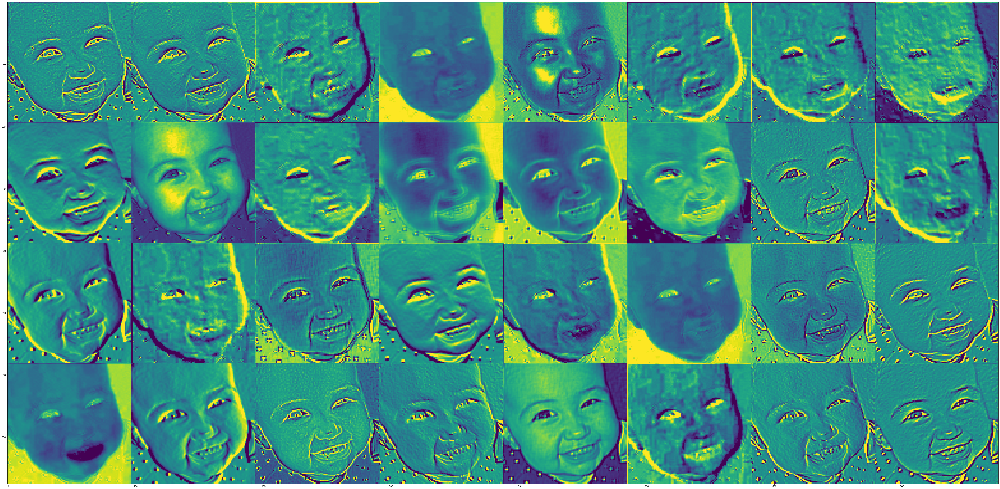

In [17]:
result1 = first_output.predict(image1.reshape((1, image.shape[0], image.shape[1], 3)))
images_per_row = 8
n_filters = result1.shape[-1]
size = result1.shape[1]
n_cols = n_filters // images_per_row

display_grid = np.zeros((n_cols*size, images_per_row*size))
for col in range(n_cols):
	for row in range(images_per_row):
		chanel_image = result1[0, :, :, col*images_per_row + row]
		chanel_image -= chanel_image.mean()
		chanel_image /= chanel_image.std()
		chanel_image *= 64
		chanel_image += 128
		chanel_image = np.clip(chanel_image, 0, 255).astype('uint8')
		display_grid[col*size : (col + 1)*size, row*size : (row + 1)*size] = chanel_image

scale = 1./size
plt.figure(figsize=(10*scale*display_grid.shape[1], 10*scale*display_grid.shape[0]))
plt.grid(False)
plt.imshow(display_grid, aspect='auto', cmap='viridis')
plt.show()

Вывод третьего слоя

In [20]:
from tensorflow import keras
first_output = keras.Model(inputs=loaded_model.input, outputs=loaded_model.layers[7].output)
first_output.summary()

Model: "model_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 200, 200, 3)]     0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 99, 99, 32)        864       
_________________________________________________________________
batch_normalization_1 (Batch (None, 99, 99, 32)        96        
_________________________________________________________________
activation_1 (Activation)    (None, 99, 99, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 97, 97, 32)        9216      
_________________________________________________________________
batch_normalization_2 (Batch (None, 97, 97, 32)        96        
_________________________________________________________________
activation_2 (Activation)    (None, 97, 97, 32)        0   

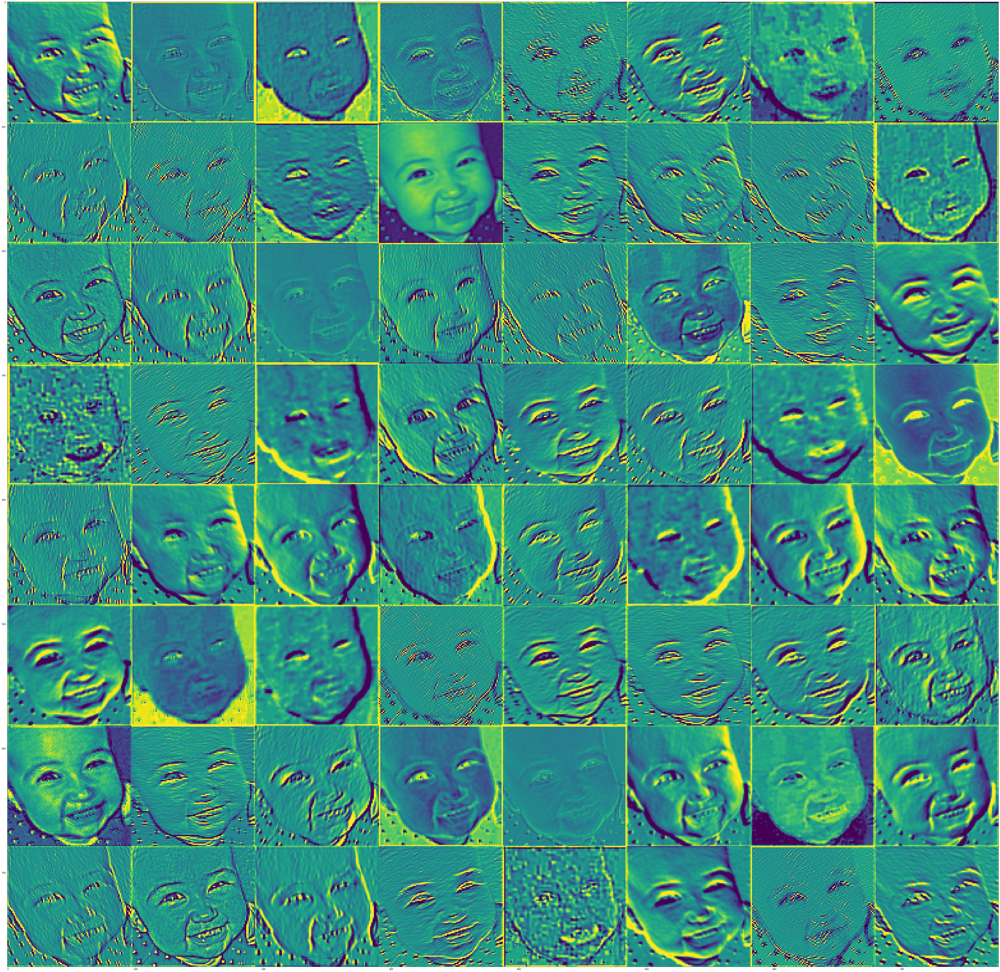

In [21]:
result1 = first_output.predict(image1.reshape((1, image.shape[0], image.shape[1], 3)))
images_per_row = 8
n_filters = result1.shape[-1]
size = result1.shape[1]
n_cols = n_filters // images_per_row

display_grid = np.zeros((n_cols*size, images_per_row*size))
for col in range(n_cols):
	for row in range(images_per_row):
		chanel_image = result1[0, :, :, col*images_per_row + row]
		chanel_image -= chanel_image.mean()
		chanel_image /= chanel_image.std()
		chanel_image *= 64
		chanel_image += 128
		chanel_image = np.clip(chanel_image, 0, 255).astype('uint8')
		display_grid[col*size : (col + 1)*size, row*size : (row + 1)*size] = chanel_image

scale = 1./size
plt.figure(figsize=(10*scale*display_grid.shape[1], 10*scale*display_grid.shape[0]))
plt.grid(False)
plt.imshow(display_grid, aspect='auto', cmap='viridis')
plt.show()

Вывод четвертого слоя

In [24]:
from tensorflow import keras
first_output = keras.Model(inputs=loaded_model.input, outputs=loaded_model.layers[11].output)
first_output.summary()

Model: "model_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 200, 200, 3)]     0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 99, 99, 32)        864       
_________________________________________________________________
batch_normalization_1 (Batch (None, 99, 99, 32)        96        
_________________________________________________________________
activation_1 (Activation)    (None, 99, 99, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 97, 97, 32)        9216      
_________________________________________________________________
batch_normalization_2 (Batch (None, 97, 97, 32)        96        
_________________________________________________________________
activation_2 (Activation)    (None, 97, 97, 32)        0  

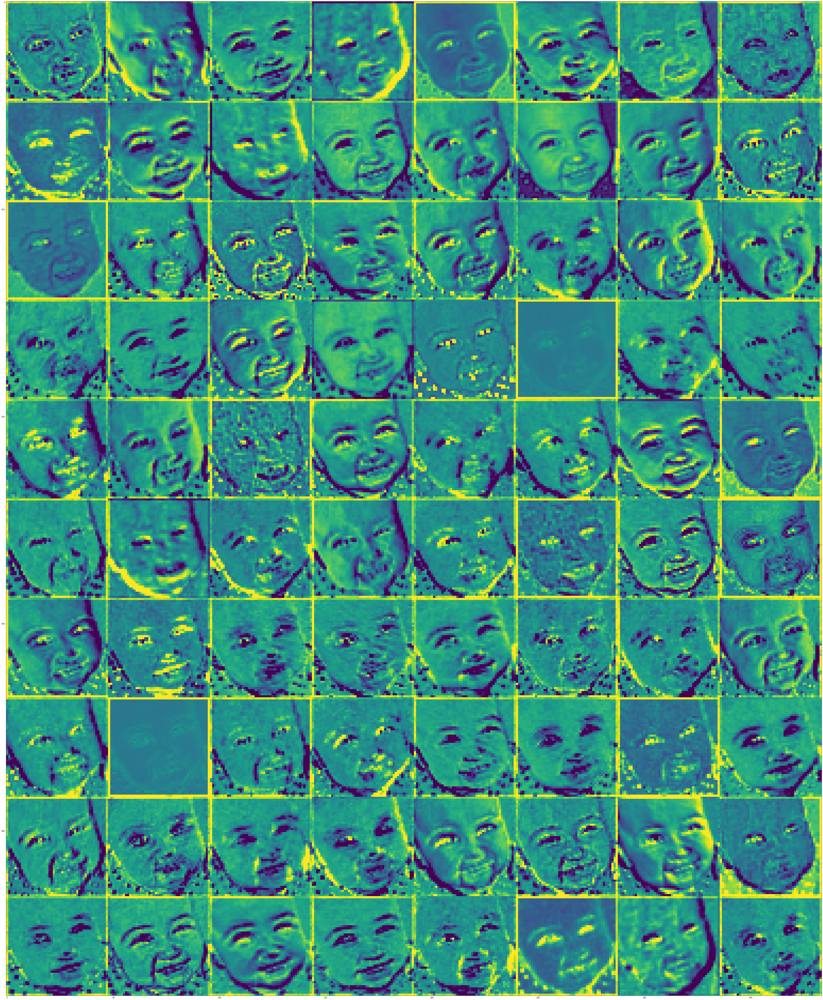

In [25]:
result1 = first_output.predict(image1.reshape((1, image.shape[0], image.shape[1], 3)))
images_per_row = 8
n_filters = result1.shape[-1]
size = result1.shape[1]
n_cols = n_filters // images_per_row

display_grid = np.zeros((n_cols*size, images_per_row*size))
for col in range(n_cols):
	for row in range(images_per_row):
		chanel_image = result1[0, :, :, col*images_per_row + row]
		chanel_image -= chanel_image.mean()
		chanel_image /= chanel_image.std()
		chanel_image *= 64
		chanel_image += 128
		chanel_image = np.clip(chanel_image, 0, 255).astype('uint8')
		display_grid[col*size : (col + 1)*size, row*size : (row + 1)*size] = chanel_image

scale = 1./size
plt.figure(figsize=(10*scale*display_grid.shape[1], 10*scale*display_grid.shape[0]))
plt.grid(False)
plt.imshow(display_grid, aspect='auto', cmap='viridis')
plt.show()

Вывод пятого слоя

In [28]:
from tensorflow import keras
first_output = keras.Model(inputs=loaded_model.input, outputs=loaded_model.layers[14].output)
first_output.summary()

Model: "model_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 200, 200, 3)]     0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 99, 99, 32)        864       
_________________________________________________________________
batch_normalization_1 (Batch (None, 99, 99, 32)        96        
_________________________________________________________________
activation_1 (Activation)    (None, 99, 99, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 97, 97, 32)        9216      
_________________________________________________________________
batch_normalization_2 (Batch (None, 97, 97, 32)        96        
_________________________________________________________________
activation_2 (Activation)    (None, 97, 97, 32)        0  

In [29]:
result1 = first_output.predict(image1.reshape((1, image.shape[0], image.shape[1], 3)))
images_per_row = 8
n_filters = result1.shape[-1]
size = result1.shape[1]
n_cols = n_filters // images_per_row

display_grid = np.zeros((n_cols*size, images_per_row*size))
for col in range(n_cols):
	for row in range(images_per_row):
		chanel_image = result1[0, :, :, col*images_per_row + row]
		chanel_image -= chanel_image.mean()
		chanel_image /= chanel_image.std()
		chanel_image *= 64
		chanel_image += 128
		chanel_image = np.clip(chanel_image, 0, 255).astype('uint8')
		display_grid[col*size : (col + 1)*size, row*size : (row + 1)*size] = chanel_image

scale = 1./size
plt.figure(figsize=(10*scale*display_grid.shape[1], 10*scale*display_grid.shape[0]))
plt.grid(False)
plt.imshow(display_grid, aspect='auto', cmap='viridis')
plt.show()

Вывод шестого слоя

In [32]:
from tensorflow import keras
first_output = keras.Model(inputs=loaded_model.input, outputs=loaded_model.layers[18].output)
first_output.summary()

Model: "model_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 200, 200, 3)]     0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 99, 99, 32)        864       
_________________________________________________________________
batch_normalization_1 (Batch (None, 99, 99, 32)        96        
_________________________________________________________________
activation_1 (Activation)    (None, 99, 99, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 97, 97, 32)        9216      
_________________________________________________________________
batch_normalization_2 (Batch (None, 97, 97, 32)        96        
_________________________________________________________________
activation_2 (Activation)    (None, 97, 97, 32)        0  

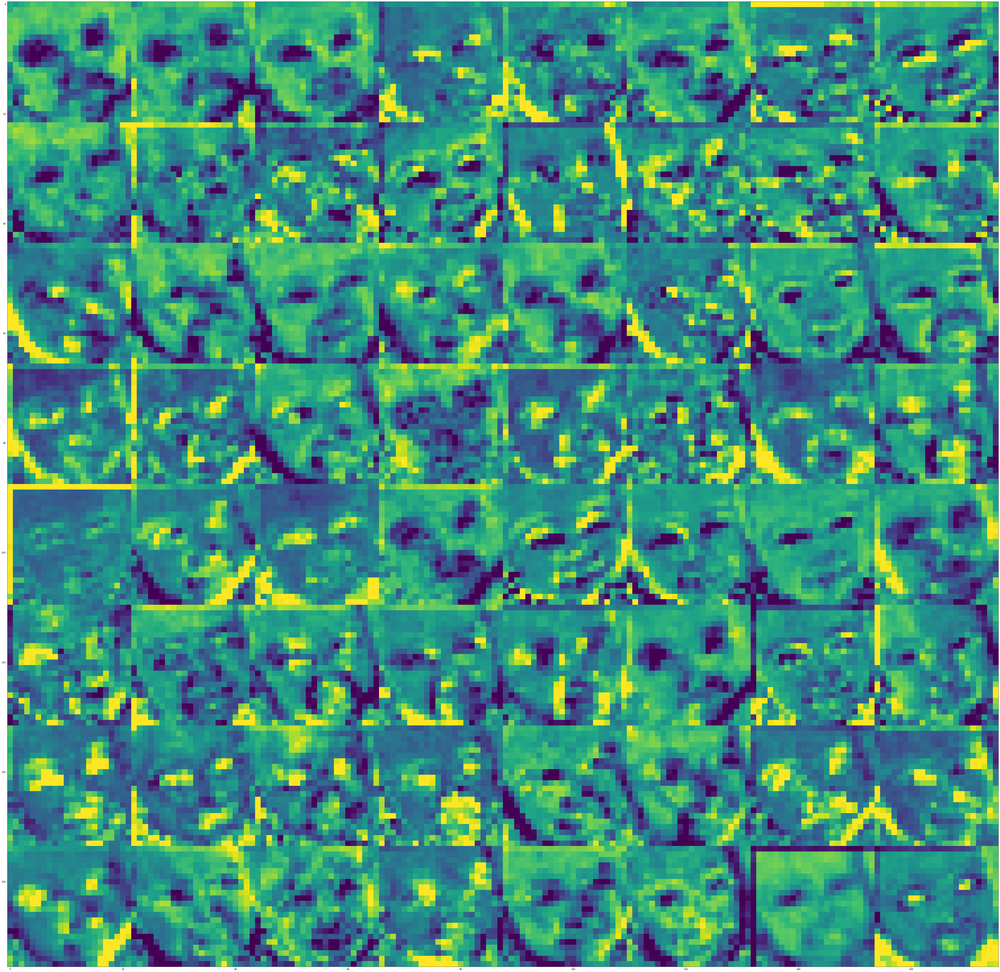

In [33]:
result1 = first_output.predict(image1.reshape((1, image.shape[0], image.shape[1], 3)))
images_per_row = 8
n_filters = result1.shape[-1]
size = result1.shape[1]
n_cols = n_filters // images_per_row

display_grid = np.zeros((n_cols*size, images_per_row*size))
for col in range(n_cols):
	for row in range(images_per_row):
		chanel_image = result1[0, :, :, col*images_per_row + row]
		chanel_image -= chanel_image.mean()
		chanel_image /= chanel_image.std()
		chanel_image *= 64
		chanel_image += 128
		chanel_image = np.clip(chanel_image, 0, 255).astype('uint8')
		display_grid[col*size : (col + 1)*size, row*size : (row + 1)*size] = chanel_image

scale = 1./size
plt.figure(figsize=(10*scale*display_grid.shape[1], 10*scale*display_grid.shape[0]))
plt.grid(False)
plt.imshow(display_grid, aspect='auto', cmap='viridis')
plt.show()

Вывод седьмого слоя

In [40]:
from tensorflow import keras
first_output = keras.Model(inputs=loaded_model.input, outputs=loaded_model.layers[28].output)
first_output.summary()

Model: "model_23"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 200, 200, 3)]     0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 99, 99, 32)        864       
_________________________________________________________________
batch_normalization_1 (Batch (None, 99, 99, 32)        96        
_________________________________________________________________
activation_1 (Activation)    (None, 99, 99, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 97, 97, 32)        9216      
_________________________________________________________________
batch_normalization_2 (Batch (None, 97, 97, 32)        96        
_________________________________________________________________
activation_2 (Activation)    (None, 97, 97, 32)        0  

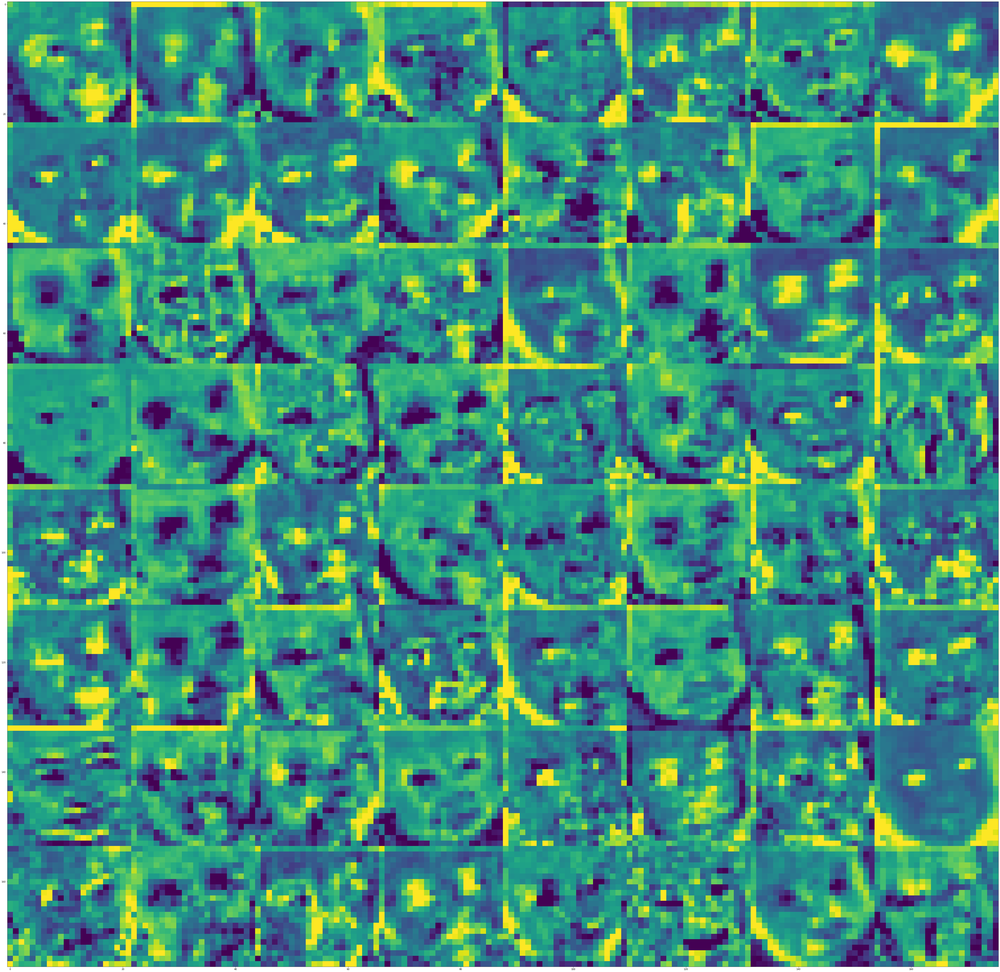

In [41]:
result1 = first_output.predict(image1.reshape((1, image.shape[0], image.shape[1], 3)))
images_per_row = 8
n_filters = result1.shape[-1]
size = result1.shape[1]
n_cols = n_filters // images_per_row

display_grid = np.zeros((n_cols*size, images_per_row*size))
for col in range(n_cols):
	for row in range(images_per_row):
		chanel_image = result1[0, :, :, col*images_per_row + row]
		chanel_image -= chanel_image.mean()
		chanel_image /= chanel_image.std()
		chanel_image *= 64
		chanel_image += 128
		chanel_image = np.clip(chanel_image, 0, 255).astype('uint8')
		display_grid[col*size : (col + 1)*size, row*size : (row + 1)*size] = chanel_image

scale = 1./size
plt.figure(figsize=(10*scale*display_grid.shape[1], 10*scale*display_grid.shape[0]))
plt.grid(False)
plt.imshow(display_grid, aspect='auto', cmap='viridis')
plt.show()